In [1]:
%load_ext autoreload
%autoreload 2
from dig.xgraph.dataset import *
from dig.xgraph.models import *
import torch
from torch_geometric.data import DataLoader
from torch_geometric.data import Data, InMemoryDataset, download_url, extract_zip
import os.path as osp
import os

import sys
import time

import pickle as pkl
from matplotlib import pyplot as plt
import networkx as nx
import numpy as np


from Extractor import Extractor
from scipy.sparse import coo_matrix,csr_matrix
#import tensorflow as tf
import torch
from utils import *
from model import *
from train import *

from explain import *
import time
from tqdm import tqdm
from sklearn.metrics import roc_auc_score
from torch_geometric.utils import to_networkx
import json
np.set_printoptions(threshold=sys.maxsize)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device in use: ', device)
kwargs = {}
kwargs['node_name_list'] = ['C', 'O', 'Cl', 'H', 'N', 'F', 'Br', 'S', 'P', 'I', 'Na', 'K', 'Li', 'Ca']
select = np.load('gt_index.npy')
edge_lists = np.load('edge_lists.npy', allow_pickle = True)
edge_label_lists = np.load('edge_label_lists.npy', allow_pickle=True)

/home/grads/q/qf31/anaconda3/envs/graph/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 803: system has unsupported display driver / cuda driver combination (Triggered internally at  /opt/conda/conda-bld/pytorch_1607370156314/work/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


device in use:  cpu


In [2]:
from torch_geometric.datasets import TUDataset
dataset = TUDataset(root='./dataset/Mutagenicity', name='Mutagenicity', use_node_attr=True)
dataset.len()

4337

In [3]:
train_len = int(0.8 * dataset.len())
test_len = dataset.len() - train_len
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_len, test_len])

In [5]:
gcn_model = torch.load('./checkpoint/gcn_mutag_vis', map_location=torch.device(device))
load_model = gcn_model

In [6]:
# new rw score
def adjacent_process(data, node_range = None):
    '''
    transfer an edge_index to matrix hash map
    node_range: node list that is considered
    '''
    node_range = range(data.x.shape[0]) if node_range is None else node_range
    matrix = {}
    for n in node_range:
        matrix[n] = []
    

    for i in range(data.edge_index.shape[1]):
        r = int(data.edge_index[0][i])
        c = int(data.edge_index[1][i])
        if r not in node_range or c not in node_range:
            continue
        matrix[ r ].append( c )
    #print('=========A: ', matrix)
    return matrix

def if_connect(set_1, set_2, A):
    '''
    return if two sets connect to each other
    A is adjacent matrix hash map
    '''
    for i in set_1:
        for j in set_2:
            if j in A[i]:
                return True

    return False

def find_neighbor(node_list, A):
    '''
    find neighbor of node_list
    A : adjacent matrix
    '''

    ans = []
    for n in node_list:
        for ne in A[n]:
            if ne not in node_list and ne not in ans:
                ans.append(ne)

    return ans

def find_rw_neighbor(node_list, A):
    '''
    find neighbor of node_list
    A : adjacent matrix
    '''

    ans = []
    for n in node_list:
        for ne in A[n]:
            if ne not in node_list and ne not in ans:
                ans.append(node_list + [ne])

    return ans

def find_rw_sample(node_list, A, walk_depth=1, breadth_max=10):
    '''
    find random walk of node_list
    A: adjacent matrix
    '''
    ans = []
    rw_list = [[]] # zero depth
    for _ in range(walk_depth):
        new_rw_list = []
        for rw in rw_list:
            neighbor_list = find_neighbor(node_list + rw,A)
            neighbor_list = [rw+[n] for n in neighbor_list]
            new_rw_list += neighbor_list

        random.shuffle(new_rw_list)
        rw_list = new_rw_list[:breadth_max]
        ans += rw_list # history
    #print('find rw neighgor: ', ans)
    return ans

def merge(comp_list, cand_list, A):
    '''
    merge new candidates node to old comp, aggregate linked group
    comp_list like: [[1,2], [3,4,5], [6]]
    cand_list like: [7,8,9]
    A: adjacent matrix hash map
    '''
    for cand in cand_list:
        new_comp_list = [[cand]]
        for comp in comp_list:
            if if_connect(new_comp_list[0], comp, A):
                new_comp_list[0].extend(comp)
            else:
                new_comp_list.append(comp)

        comp_list = new_comp_list

    return comp_list

def get_rw_score(load_model, data, class_idx, comp, A,softmax):
    # get neighbor
    #print('======= comp is:', comp)
    n_list = find_rw_sample(comp, A)
    #find_rw_neighbor(comp, A)
    #print('======= its neighbor is ', n_list)
    #score = get_score(load_model, data.to(device), [comp], softmax = softmax)[class_idx]['rel'][0]
    if len(n_list) == 0:
        return get_score(load_model, data.to(device), [comp], softmax = softmax)[class_idx]['rel'][0]
    #else:
    #    for n in n_list:
    #        score += get_score(load_model, data.to(device), [comp + [n]], softmax = softmax)[class_idx]['rel'][0]
    #    return score / (len(n_list)+1)
    context_score = np.sum(get_score(load_model, data.to(device), n_list, softmax = softmax)[class_idx]['rel'])
    n_list += [[]]
    n_list = [n+comp for n in n_list]
    #print('n_list:',n_list)
    score = np.sum(get_score(load_model, data.to(device), n_list, softmax = softmax)[class_idx]['rel']) - context_score
    return score/len(n_list)

def agglomerate(load_model, data, percentile = 60, class_idx = 0, node_range = None, softmax = False):
    class_idx = class_idx if class_idx is not None else (int)(dataset[idx].y[0])
    #print('======= class idx: ', class_idx)
    node_range = range(data.x.shape[0]) if node_range is None else node_range
    
    A = adjacent_process(data, node_range)
    # init build, every node score
    mask_list = []
    for i in node_range:
        mask_list.append([i])
    scores = []
    for m in mask_list:
        scores.append(get_rw_score(load_model, data, class_idx, m, A, softmax=softmax))
    #scores = get_score(load_model, data.to('cuda'), mask_list, softmax = softmax)[class_idx]['rel']
    #print('++++',scores)
    # mean sub
    #print('before scores: ', scores)
    scores = scores - np.mean(scores)
    scores = np.absolute(scores)
    #print('after scores: ', scores)

    thresh_hold = np.nanpercentile(scores, percentile)
    #cand_list = np.where(scores >= thresh_hold)[0].tolist()
    cand_list = np.take(node_range, np.where(scores >= thresh_hold)[0])
    cand_list = list(set(cand_list) & set(node_range))
    
    comp_list = merge([], cand_list, A)
    #print('comp_list: ', comp_list)

    # begin add nodes
    comp_all = []
    comp_all_score = []

    comp_all.append(mask_list.copy())
    #comp_all_score.append([ get_score(load_model, data.to('cuda'), [c], softmax = False)[class_idx]['rel'][0] for c in mask_list])
    comp_all_score.append([ get_rw_score(load_model, data, class_idx, c, A, softmax=softmax) for c in mask_list])

    comp_all.append(comp_list.copy())
    comp_all_score.append([ get_rw_score(load_model, data, class_idx, c, A, softmax=softmax) for c in comp_list])

    for _ in range(500):
        #print('###############loop: ', _ )
        # find neibors for each comp
        cand_list = []
        scores = []
        for comp in comp_list:
            neighbors = find_neighbor(comp, A)
            #print('comp ',comp, " : ", find_neighbor(comp, A))
            # score for each neighbor
            for n in neighbors:
                old_set = comp.copy()
                new_set = comp.copy()
                new_set.append(n)
                #print('old_Set: ', old_set)
                #print('new_Set: ', new_set)

                #scores.append(get_score(load_model, data.to('cuda'), [new_set], softmax = False)[class_idx]['rel'][0] -  get_score(load_model, data.to('cuda'), [old_set], softmax = False)[class_idx]['rel'][0])
                scores.append(get_rw_score(load_model, data, class_idx, new_set, A, softmax=softmax) -  get_rw_score(load_model, data, class_idx, old_set, A, softmax=softmax))

            cand_list.extend(neighbors)
        #print('cand_list: ', cand_list)
        #print('scores: ', scores)
        scores -= np.mean(scores)

        scores = np.absolute(scores)
        thresh_hold = np.nanpercentile(scores, percentile)
        #print('thresh_hold: ', thresh_hold)
        cand_list = np.take(cand_list, np.where(scores >= thresh_hold)[0])
        cand_list = np.unique(cand_list)
        #print(cand_list)
        #print(comp_list)
        # merge 
        comp_list = merge(comp_list, cand_list, A)
        #print(comp_list)
        comp_sum = np.sum([ len(c) for c in comp_list])
        #print([ len(a) for c in comp_list])
        #print('comp sum: ', comp_sum)
        comp_all.append(comp_list.copy())
        #comp_all_score.append([ get_score(load_model, data.to('cuda'), [c], softmax = False)[class_idx]['rel'][0] for c in comp_list])
        comp_all_score.append([ get_rw_score(load_model, data, class_idx, c, A, softmax=softmax) for c in comp_list])
        if len(node_range) <= comp_sum:
            #print('BBBBBBBBBBBBBRRRRRRRRRRRRRRREEEEEEEEEEEEEEKKKKKKKKKKKKKK')
            break

    #print('comp_all_score: ', comp_all_score)
    return comp_all, comp_all_score

In [7]:
import matplotlib
global edges
def hier_explain(dataset, model, idx, class_idx = None, visible = True, figsize = None, percentile = 75, **kwargs):
    global edges
    class_idx = int(class_idx) if class_idx is not None else (int)(dataset[idx].y[0])
    idx = int(idx)
    begin_time = time.time()
    data = get_data(dataset, idx)
    comp_all,comp_all_score = agglomerate(model, data,class_idx=class_idx, percentile = percentile, softmax=False)
    color_max = max([max(comp_score) for comp_score in comp_all_score]) 
    color_min = min([min(comp_score) for comp_score in comp_all_score]) 
    #color_max = 0.8
    #color_min = -0.8
    print('color range: ', color_max, ' ', color_min)
    node_sizes = 1000
    if visible:
        

        G = to_networkx(dataset[idx])

        pos = nx.kamada_kawai_layout(G)

        #node_sizes = 600 * size_ratio
        #node_colors = class_score[class_idx]['rel']


        cmap = plt.cm.coolwarm
        if figsize is None:
            fig = plt.figure(figsize = (10 * len(comp_all),10),dpi=100, facecolor="white")
        else:
            fig = plt.figure(figsize = figsize ,dpi=100, facecolor="white")
        
        for layer in range(len(comp_all)):
            plt.subplot(1, len(comp_all), layer+1)

            #find white nodes
            white_nodes = set([n for n in range(data.x.shape[0])])
            comp_list = comp_all[layer]
            comp_score = comp_all_score[layer]


            # print comp nodes
            for i in range(len(comp_list)):
                white_nodes = white_nodes - set(comp_list[i])

                nodes = nx.draw_networkx_nodes(
                    G,
                    pos,
                    nodelist = comp_list[i],
                    node_size = node_sizes,
                    node_color = [comp_score[i]] * len(comp_list[i]),
                    cmap=cmap,
                    edgecolors='black',
                    vmax = color_max,
                    vmin = color_min,
                    alpha = 0.6,
                )


                edges = nx.draw_networkx_edges(
                    G.subgraph(comp_list[i]),
                    pos,
                    #node_size=node_sizes,
                    arrowstyle="-",
                    #arrowsize=10,
                    width=20,
                    connectionstyle= 'arc3, rad=0.2',
                    style='-.',
                    alpha=0.3,
                    edge_cmap = cmap,
                    edge_color = [comp_score[i]] * len(G.subgraph(comp_list[i]).edges),
                    edge_vmin = color_min,
                    edge_vmax = color_max,

                    
                )
            
            # print white nodes
            nodes_ = nx.draw_networkx_nodes(
                G,
                pos,
                nodelist = list(white_nodes),
                node_size = node_sizes,
                node_color = ['tab:gray'] * len(white_nodes),
                cmap=cmap,
                #edgecolors='blue',
                vmax = color_max,
                vmin = color_min,
                alpha = 0.3
            )

            edges = nx.draw_networkx_edges(
                G,
                pos,
                #node_size=node_sizes,
                arrowstyle="-",
                #arrowsize=10,
                width=2,
                #connectionstyle= 'arc, rad=0.2',
                style=':',
                alpha=0.3
            )
            label_list = {}
            for i in range(dataset[idx].x.shape[0]):
                label_list[i] = ""#str(i)
                if 'node_name_list' in kwargs:
                    node_name_idx = int(np.argmax(dataset[idx].x[i]))
                    label_list[i] += '' + kwargs['node_name_list'][node_name_idx]
                if 'text_dict' in kwargs:
                    label_list[i] += '' + kwargs['text_dict'][str(idx)][i]
                

            labels = nx.draw_networkx_labels(G, pos, label_list, font_size=22, font_color="black")
            #plt.colorbar(nodes)

            #ax = plt.gca()
            #ax.set_axis_off()
            #if layer+1 == 1:
            #    continue
            #plt.subplot(1, len(comp_all), layer+1)
            print("layer", layer+1)
        #plt.colorbar(nodes)
        plt.show()

color range:  1.1851212645997293   -0.15076085180044174
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6
layer 7
layer 8


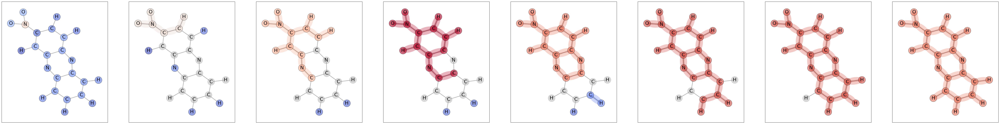

In [13]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 22, class_idx = 0, figsize = None, percentile = 55, **kwargs)

color range:  0.7623858240743479   -0.23501348495483398
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6
layer 7
layer 8
layer 9
layer 10


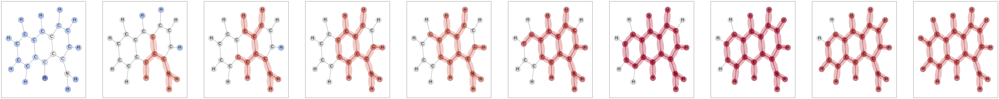

In [9]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 31, class_idx = 0, figsize = None, percentile = 60, **kwargs)

color range:  0.2436525747179985   -0.5257679585367441
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6
layer 7


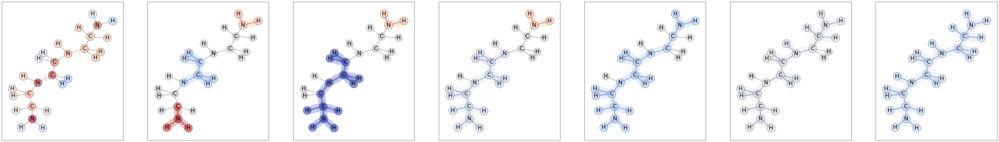

In [10]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 190, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  0.5460358262062073   -0.5935025165478388
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6


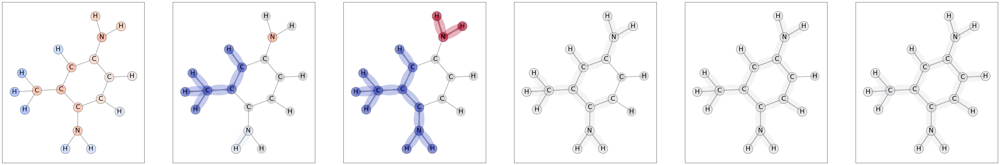

In [11]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 4202, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  0.5207665245980024   -0.695806086063385
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6
layer 7


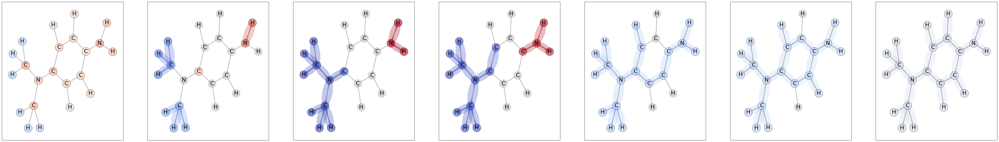

In [14]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 4049, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  0.5242591351270676   -0.603878065943718
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6


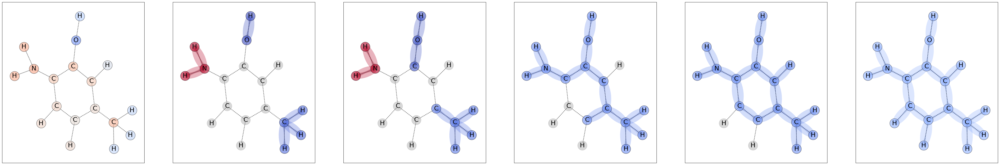

In [15]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 3224, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  0.4237222479035457   -0.45092507828958334
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6
layer 7
layer 8


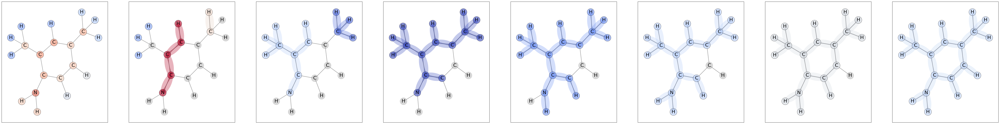

In [16]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 3410, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  1.4306102991104126   -1.2116912603378296
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6


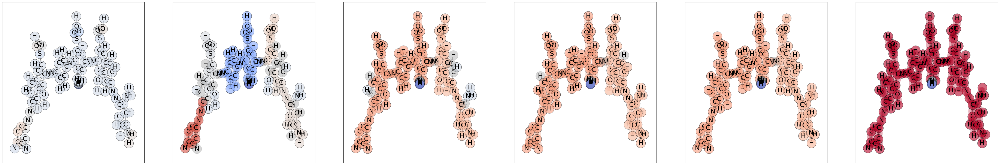

In [17]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 133, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  0.5262596011161804   -0.4110723063349724
layer 1
layer 2
layer 3
layer 4
layer 5


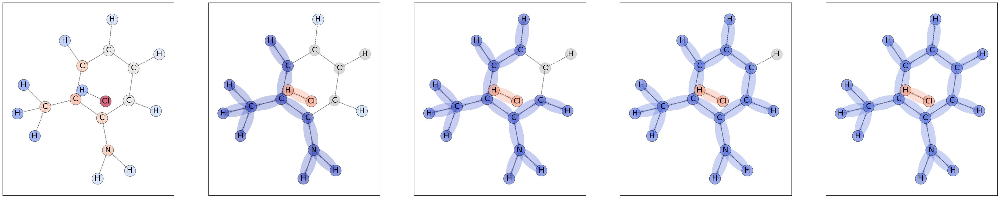

In [18]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 637, class_idx = 0, figsize = None, percentile = 20, **kwargs)

color range:  0.3089161813259125   -0.659236490726471
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6


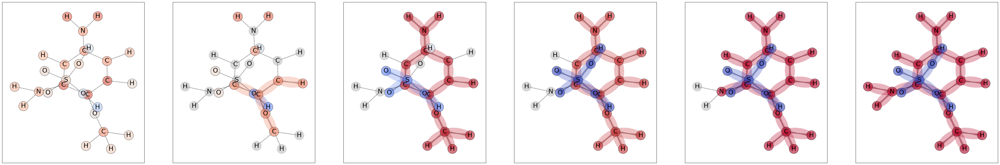

In [19]:
load_model = gcn_model
hier_explain(dataset, load_model, idx = 640, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  0.9436652084987145   -0.3802676498889923
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6
layer 7
layer 8


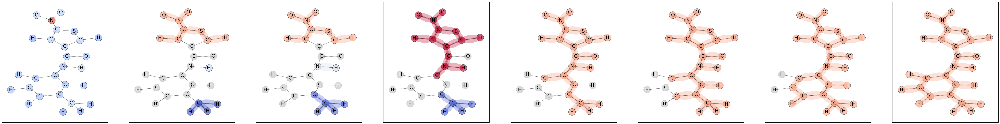

In [20]:
hier_explain(dataset, load_model, idx = 10, class_idx = 0, figsize = None, percentile = 50, **kwargs)

color range:  1.000015730659167   -0.15926847979426384
layer 1
layer 2
layer 3
layer 4
layer 5
layer 6


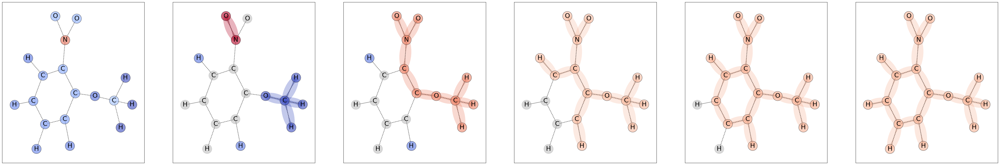

In [21]:
hier_explain(dataset, load_model, idx = 44, class_idx = 0, figsize = None, percentile = 50, **kwargs)